<a href="https://colab.research.google.com/github/amalvarezme/SenalesSistemas/blob/master/5_TransformadaZ/Tz_Audio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Serie de Fourier

Sea la señal:

\begin{equation}
x(t) = \begin{cases} 1, & -T/2 \leq t < 0 \\ -1, & 0 \leq t < T/2 \end{cases}
\end{equation}


Text(0, 0.5, 'x(t)')

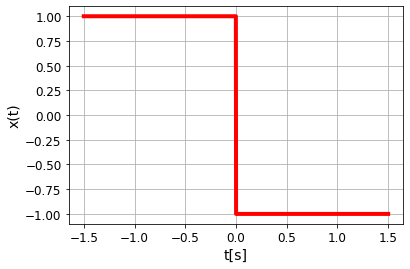

In [0]:
# Para graficar
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

T = 3 #3 segundos de grafica
Fs = 500 # 500 muestras por segundo
Nm = T*Fs #numero de muestras requeridas
tv = np.linspace(-T/2,T/2,Nm)

xo = np.concatenate((np.ones(int(Nm/2)), -np.ones(int(Nm/2))), axis=0)

plt.plot(tv,xo,'r',linewidth=4)
plt.grid()
plt.xlabel("t[s]",fontsize = 14)
plt.ylabel("x(t)",fontsize = 14)


Su espectro en serie de Fourier se calcula como:

\begin{equation}
c_n = \frac{1}{T}\int_{-T/2}^{T/2}{x(t)e^{-jn\omega_ot}dt},
\end{equation}
donde:

\begin{equation}
c_n = \frac{j}{n\pi}((-1)^n-1)
\end{equation}

Además, se sabe que la reconstrucción de $x(t)$ desde el espectro $c_n$ se obtiene como:

\begin{equation}
\hat{x}(t) = \sum\limits_{n=-N}^N{c_n e^{jnw_ot}}
\end{equation}


In [0]:
N = 500 #numero armonicos
wo = 2*np.pi/T # frecuencia fundamentas
# %% definir bases
phin = np.zeros((Nm,2*N+1),dtype=np.complex_)
for n in range(-N,N+1,1):
    phin[:,n+N] = np.exp(1j*n*wo*tv)
    


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in multiply
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


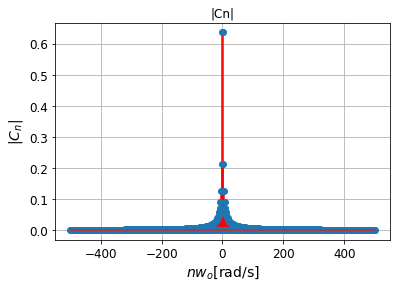

In [0]:
cn = np.zeros(2*N+1,dtype=np.complex_)
nv = np.linspace(-N, N, 2*N+1) #vector num armónicos
Cn = ((1j)/(nv*np.pi))*(1-(-1)**nv) 
Cn[N] = 0 
#graficar espectro
#plt.figure(figsize = (10, 8))
plt.stem(nv, abs(Cn), 'r')
plt.title(r'|Cn|')
plt.xlabel(r'$nw_o$[rad/s]',fontsize = 14)
plt.ylabel(r'$|C_n|$',fontsize = 14)
plt.axis('tight')
plt.grid()
        

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


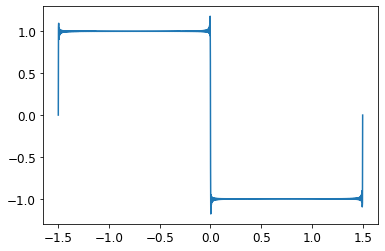

In [0]:
xe = phin @ Cn  #producto matricial para calcular componentes espectrales
plt.plot(tv,xe)

La serie de Fourier asume $x(t)$ como señal en tiempo continuo, pero evaluado en un segmento finito $t\in[-T/2,T/2].$ Por consiguiente, si se evalua $t$ fuera del rango de análisis la serie asume periodicidad en la señal de entrada.

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


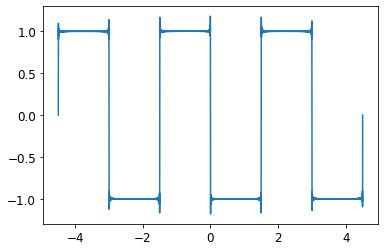

In [0]:

Np = 3 #numero de periodos a graficar
tv2 = np.linspace(-Np*T/2,Np*T/2,Np*T*Fs)
phin2 = np.zeros((len(tv2),2*N+1),dtype=np.complex_)
for n in range(-N,N+1,1):
    phin2[:,n+N] = np.exp(1j*n*wo*tv2)
    
xe2 = phin2 @ Cn  #producto matricial para calcular componentes espectrales
plt.plot(tv2,xe2)

# Transformada de Fourier

La transformada de Fourier se puede entender como la extensión de la serie de Fourier para $t\in(-\infty,+\infty)$:

\begin{equation}
X(\omega) = \int_{-\infty}^{+\infty}{x(t)e^{-j\omega t}dt}.
\end{equation}
La respectiva transformada inversa (extensión de la reconstrucción mediante serie de Fourier con $t\in(-\infty,+\infty)$) se define como:

\begin{equation}
x(t) = \frac{1}{2\pi}\int_{-\infty}^{+\infty}{X(\omega)e^{j\omega t}d\omega}.
\end{equation}

Cabe resaltar entonces que el concepto de espectro en frecuencia para la transformada de Fourier asume que $\omega \in (-\infty,+\infty).$

En resumen, la serie de Fourier analiza $x(t)\in \mathbb{R} o \mathbb{C}$ en tiempo continuo sobre segmento finito $t\in [-T/2,+T/2]$, en espectro en frecuencia discreto $c_n \in \mathbb{R} o \mathbb{C}$, con $n\in \mathbb{Z}.$ La transformada de Fourier analiza $x(t)\in \mathbb{R} o \mathbb{C}$ en tiempo continuo sobre segmento infinito $t\in (-\infty,+\infty)$, en espectro en frecuencia continuo (función de densidad espectral) $X(\omega)\in \mathbb{R} o \mathbb{C}$, con $\omega\in (-\infty,+\infty).$




# Transformada de Fourier en tiempo discreto

A partir de la transformada de Fourier, se puede analizar también una señal en tiempo discreto $x[k]\in \mathbb{R} o \mathbb{C},$ con $k\in\mathbb{Z}$, con el fin de calcular su espectro en frecuencia continuo (función de densidad espectral) $X(\omega)\in \mathbb{R} o \mathbb{C}$, pero con $\omega$ continua en el intervalo $\omega\in [-\pi,+\pi]$ o $\omega\in [0,2\pi],$  dado que las bases de representación requieren restringir la codificación de la señal $x[n]$ utilizando funciones seno y coseno originales según la expresión:

\begin{equation}
X(\omega) = \sum_{k=0}^{K-1}{x[k]e^{-j\omega k}},
\end{equation}
en donde se asume una señal en tiempo discreto con $K$ muestras. A la expresión anterior se le conoce comunmente como la trasformada de Fouirer en tiempo discreto (Discrete time Fourier transform - DTFT). 
y su respectiva transformada inversa (iDTFT) se expresa como:


\begin{equation}
x[k] = \frac{1}{2\pi}\int_{-\pi}^{+\pi}{X(\omega)e^{j\omega k}d\omega}=\frac{1}{2\pi}\int_{0}^{+2\pi}{X(\omega)e^{j\omega k}d\omega}
\end{equation}


# Transformada discreta de Fourier y transformada rápida de Fourier

Sin embargo, tanto para la serie de Fourier, como para la transformada (continua y discreta en tiempo), se require de la resolución analítica de integrales, además, de las suposición de intervalos infinitos en tiempo y frecuencia (para el caso de la transformada de Fourier), los cuales no son viables ni implementables en la práctica. 

Por consiguiente, el concepto de espectro en frecuencia se extiende a sistemas de proceso de digital (tiempo discreto y  frecuencia discreta), mediante el cálculo de la transformada discreta de Fourier (Discrete Fourier Transform - DFT).

En este caso, la transformada discreta se define como:

\begin{equation}
X[n] = \sum_{k=0}^{K-1}{x[k]e^{-jk\frac{2\pi n}{K}}},
\end{equation}

es decir, la DFT es una discretización en frecuencia de la DTFT: 

\begin{equation}
X[n] = X(\omega)\Big|_{\omega=\frac{2\pi n}{K}},
\end{equation}
y con respecto a la serie de Fourier la DFT se puede relacionar mediante:

\begin{equation}
X[n] = K c_n,
\end{equation}
asumiendo señal en tiempo discreto y $\omega_o = \frac{2\pi}{K}$ en representación por serie.

Por otra parte, la transforma de Fourier inversa (iDFT) se define como:

\begin{equation}
x[k] = \sum_{n=0}^{K-1}{X[n]e^{jk\frac{2\pi n}{K}}}.
\end{equation}

Note que las variables tiempo y frecuencia discretas $n,k\in[0,K-1].$ Dado que la frecuencia fundamental se restringe como $\omega_o=\frac{2\pi}{K},$ las bases de representación en tiempo discreto codificaran frecuencias angulares en el rango $[0,2\pi)$ (cosenos y senos originales).

No obstante, en la práctica el cálculo de las sumatorias es costoso computacionalmente, a medida que $K$ aumenta. Por consiguiente, se cuentan con paquetes computacionales que optimizan el cálculo de la DFT de forma rápida, lo que conlleva a la comunmente conocida transformada rápida de Fourier (Fast Fourier Transform - FFT).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


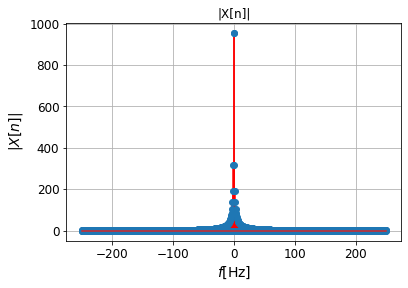

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  # This is added back by InteractiveShellApp.init_path()


Text(0, 0.5, '$|X[n]|/K$')

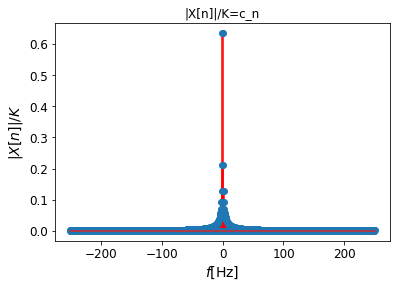

In [0]:
#cálculo de la FFT de la señal signo invertido
vf = np.fft.fftfreq(len(xo),1/Fs) #calculo vector de frecuencias
Xw = np.fft.fft(xo) #cálculo FFT

plt.stem(vf,abs(Xw),'r')
plt.title(r'|X[n]|')
plt.xlabel(r'$f$[Hz]',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.axis('tight')
plt.grid()
plt.show()
plt.stem(vf,abs(Xw)/len(vf),'r')
plt.title(r'|X[n]|/K=c_n')
plt.xlabel(r'$f$[Hz]',fontsize = 14)
plt.ylabel(r'$|X[n]|/K$',fontsize = 14)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


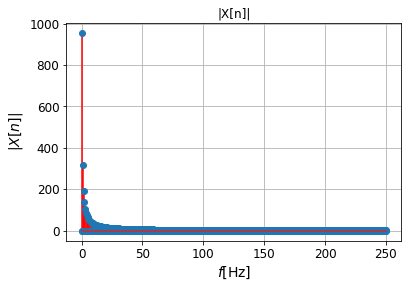

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  # This is added back by InteractiveShellApp.init_path()


Text(0, 0.5, '$|X[n]|/K$')

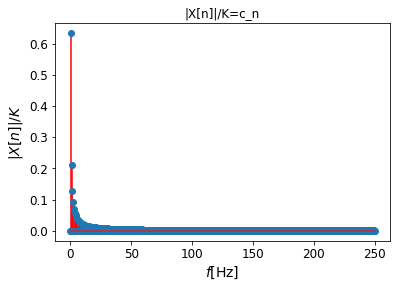

In [0]:
#dado que el espectro es simétrico, y aprovechando señales netamente reales
#se sugiere utilizar la expresión simplificada rfft

vf = np.fft.rfftfreq(len(xo),1/Fs) #calculo vector de frecuencias
Xw = np.fft.rfft(xo) #cálculo FFT
plt.stem(vf,abs(Xw),'r')
plt.title(r'|X[n]|')
plt.xlabel(r'$f$[Hz]',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.axis('tight')
plt.grid()
plt.show()
plt.stem(vf,abs(Xw)/(2*len(vf)),'r')
plt.title(r'|X[n]|/K=c_n')
plt.xlabel(r'$f$[Hz]',fontsize = 14)
plt.ylabel(r'$|X[n]|/K$',fontsize = 14)


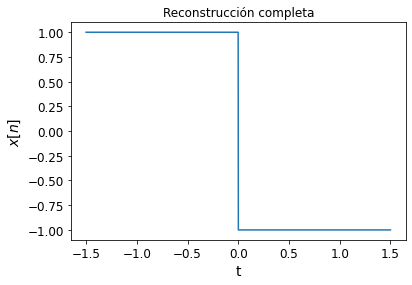

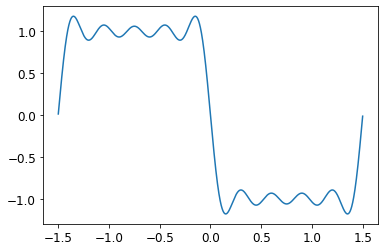

In [0]:
#la reconstrucción de x[k] se puede obtener mediante la transformada inversa
xe = np.fft.irfft(Xw)
plt.plot(tv,xe)
plt.title(r'Reconstrucción completa')
plt.xlabel(r't',fontsize = 14)
plt.ylabel(r'$x[n]$',fontsize = 14)
plt.show()
#se pueden escoger o ponderar los coeficientes para filtrar (alterar) la reconstrucción
ind = range(10,750)
Xwf = Xw.copy()
Xwf[ind] = 0
xe2 = np.fft.irfft(Xwf)
plt.plot(tv,xe2)
plt.show()


# Ejemplo FFT con señal de audio



Audio a procesar. Se puede realizar con cualquier vídeo de youtube usando youtube-dl, únicamente se necesita el enlace al vídeo (pueden introducir el que ustedes quieran). Debería quedar guardado en el folder como audio.mp3

In [0]:
! pip install youtube-dl

     |████████████████████████████████| 1.8MB 4.7MB/s 


In [0]:
link="https://www.youtube.com/watch?v=bvNZeh6f8vE"
! youtube-dl --extract-audio -o "audio.%(mp3)s" --audio-format mp3  {link}

[youtube] bvNZeh6f8vE: Downloading webpage
[download] Destination: audio.NA
[download] 100% of 3.95MiB in 00:00
[ffmpeg] Destination: audio.mp3
Deleting original file audio.NA (pass -k to keep)


In [0]:
!ffmpeg -i audio.mp3 output.wav 

ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --ena

In [0]:
!pip install soundfile

In [0]:
import soundfile as sf # para instalar pip install soundfile 
#lee archivos wav
nombre_out = "output.wav"
x, fs = sf.read(nombre_out)

# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,nombre_out))



Frecuencia de muestreo 48000.00[Hz]
audio output.wav


Text(0, 0.5, '$|X[n]|$')

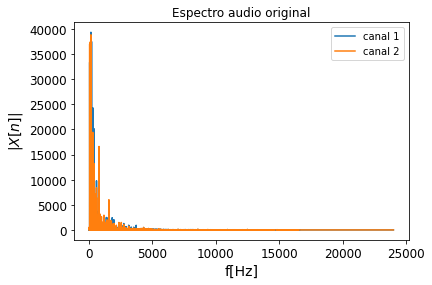

In [0]:
xpro = x.copy() #copiar archivos para procesar
ti = 30
tf = 50
xs = xpro[int(ti*fs):int((tf*fs)),:]
Xw = np.fft.rfft(xs,axis=0) # fft por cada columna de xs
vf = np.fft.rfftfreq(np.size(xs,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('canal 1','canal 2'))
plt.title(r'Espectro audio original')
plt.xlabel(r'f[Hz]',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)


In [0]:
#Para escuchar el trozo de audio con el que se va a trabajar:
#No usar un trozo muy grande o el entorno se puede desconectar
from IPython.display import Audio

In [0]:
Audio([xs[:,1], xs[:,0]],rate=fs)

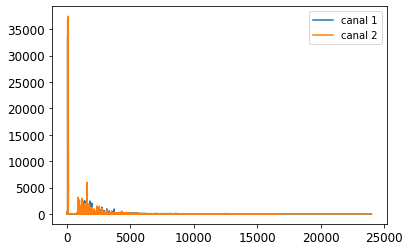

In [0]:
#filtrar espectro
Xwf = Xw.copy()
f1 = 100
f2 = 800
ind = ((vf > f1) & (vf < f2))
Xwf[ind,:] = 0
plt.plot(vf,abs(Xwf))
plt.legend(('canal 1','canal 2'))

In [0]:
xe2 = np.fft.irfft(Xwf,axis=0)

#Graficar en el tiempo puede ser muy costoso computacionalmente
# muchos puntos

#Num = np.size(xpro,0)
#T = Num/fs
#tc = np.linspace(0,T-1/fs,Num)

#plt.plot(tc,xpro)
#plt.legend(('canal 1','canal 2'))
#plt.title(r'audio original')
#plt.xlabel(r't',fontsize = 14)
#plt.ylabel(r'$x(t)$',fontsize = 14)
#plt.show()


#Num = np.size(xe2,0)
#T = Num/fs
#tc = np.linspace(0,T-1/fs,Num)

#plt.plot(tc,xe2)
#plt.legend(('canal 1','canal 2'))
#plt.title(r'audio filtrado')
#plt.xlabel(r't',fontsize = 14)
#plt.ylabel(r'$x(t)$',fontsize = 14)
#plt.show()


In [0]:
#Para guardar el audio como new_file.wav y luego descargarlo
#name_out_fil = 'new_file.wav'
#sf.write(name_out_fil, xe2, fs)
#print('Audio filtrado\n')

Audio filtrado



Audio filtrado new_file.wav...:

<audio src="new_file.wav" controls>Your browser does not support the audio element.</audio>
[new_file.wav](new_file.wav)

In [0]:
Audio([xe2[:,1], xe2[:,0]],rate=fs)

# Filtrado

### FIltro Butterworth
El filtro Butterworth posee la ventaja de contar con la respuesta más plana posible para la banda pasante, sin embargo la banda de transición es muy amplia.

In [0]:
from scipy.signal import butter as bw
from scipy.signal import freqz_zpk

In [0]:
N = 1 #orden el filtro
Wn = [2000, 5000] #banda pasante
filt = 'bandpass' #tipo del filtro (pasa-baja, pasa-alta, pasabanda, rechazabanda)
out = 'zpk' #la funcion retorna los polos y ceros junto con la ganancia. Para usar numerador y denominador usar 'ba' junto con freqz
zeros, poles, gain = bw(N, Wn, btype=filt, output=out, fs=fs)
K = len(Xw[:,0]) #longitud del vector transformada
w, h = freqz_zpk(zeros, poles, gain, worN=K, fs=fs)


In [0]:
def plot_freq_response(filter_name, w, h, N): #Mostrar la respuesta en frecuencia del filtro
  fig = plt.figure()
  ax1 = fig.add_subplot(1, 1, 1)
  ax1.set_title(filter_name +' Digital filter frequency response, order= ' + str(N))
  ax1.plot(w, 20 * np.log10(abs(h)), 'b')
  ax1.set_ylabel('Amplitude [dB]', color='b')
  ax1.set_xlabel('Frequency [Hz]')
  ax1.grid()
  ax2 = ax1.twinx()
  angles = np.unwrap(np.angle(h))
  ax2.plot(w, angles, 'g')
  ax2.set_ylabel('Angle [radians]', color='g')
  plt.axis('tight')
  plt.show() 

In [0]:
def show_zp(zeros, poles): # Mostrar la ubicación de los polos y los zeros
  fig = plt.figure()
  ax1 = fig.add_subplot(1, 1, 1)
  ax1.set_title('Z plane')
  ax1.scatter(zeros.real, zeros.imag, marker="o", color="blue", s=300)
  ax1.set_ylabel('Im{Z}')
  ax1.set_xlabel('Re{Z}')

  ax1.grid()
  ax2 = ax1.twinx()
  ax2.scatter(poles.real, poles.imag, marker="x", color="red", s=300)
  plt.axis('tight')
  plt.show()

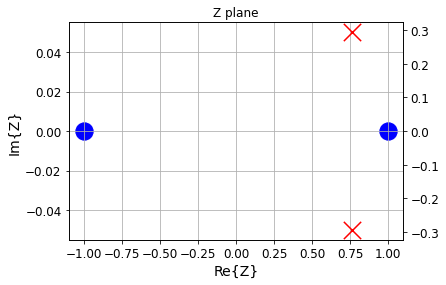

In [0]:
show_zp(zeros, poles)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log10
  """


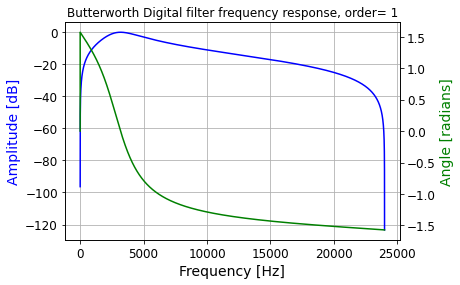

In [0]:
plot_freq_response('Butterworth', w, h, N)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log10
  """


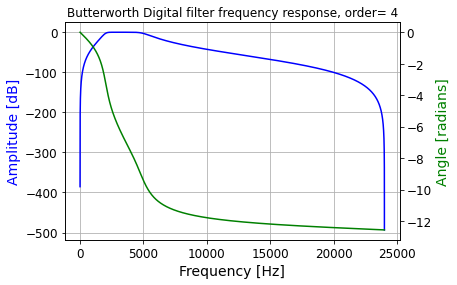

In [0]:
#Puede obtenerse un mejor resultado aumentando el grado del filtro, a cambio de un mayor coste computacional y problemas en la fase
N = 4
zeros, poles, gain = bw(N, Wn, btype=filt, output=out, fs=fs)
w, h = freqz_zpk(zeros, poles, gain, worN=K, fs=fs)

plot_freq_response('Butterworth', w, h, N)

### Filtro Chebyshev
Al contrario del filtro Butterworth, el filtro de Chebyshev tiene una pendiente en la caída muy pronunciada, por lo que la banda de transición resulta ser menor, a cambio de que existe un rizado en la banda pasante y/o rechazada. Dependiendo del lugar en el que se escoja el rizado, se tienen dos filtros diferentes de Chebyshev.


#### Chebyshev 1
Para este filtro se busca un mayor rechazo en la banda rechazada a cambio de obtener un rizado en la banda pasante

In [0]:
from scipy.signal import cheby1

In [0]:
N = 4
ripple = 10
zeros, poles, gain = cheby1(N, rp=ripple, Wn=Wn, btype=filt, output=out, fs=fs)
w, h = freqz_zpk(zeros, poles, gain, worN=K, fs=fs)

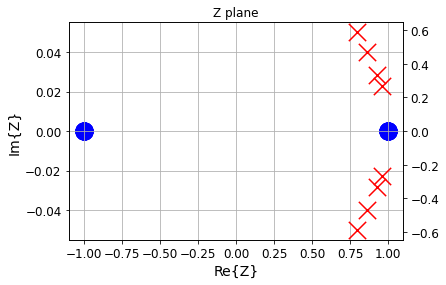

In [0]:
show_zp(zeros, poles)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log10
  """


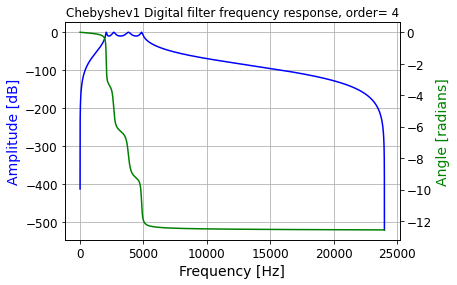

In [0]:
plot_freq_response('Chebyshev1', w, h, N)

#### Chebyshev 2
Para este caso del filtro Chebyshev, se prefiere que se tenga una respuesta plana en la banda pasante, obteniendo ahora el rizo en la banda rechazada

In [0]:
from scipy.signal import cheby2
from scipy.signal import freqz #para este caso no se van a mostrar los polos y ceros

In [0]:
N = 4
ripple = 20
out = 'ba' #no regresa los polos y ceros, sino la funcion de transferencia
num, den = cheby2(N, rs=ripple, Wn=Wn, btype=filt, output=out, fs=fs) #regresa numerador y denominador. Si se quiere obtener los polos y ceros usar scipy.signal.tf2zpk
w, h = freqz(num, den, worN=K, fs=fs)

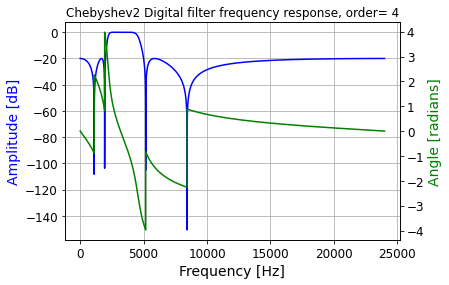

In [0]:
plot_freq_response('Chebyshev2', w, h, N)

### Filtro Elíptico (Filtro de Cauer)
Este filtro es el que contiene la banda de transición más delgada posible, poseyendo además rizado tanto en la banda pasante como en la rechazada (ambos rizados son independientes entre sí)

In [0]:
from scipy.signal import ellip

In [0]:
N = 4
ripple_pass = 2 #para la banda pasante
ripple_stop = 30 #para la banda rechazada
num, den = ellip(N, rp=ripple_pass, rs=ripple_stop, Wn=Wn, btype=filt, output=out, fs=fs) #regresa numerador y denominador. Si se quiere obtener los polos y ceros usar scipy.signal.tf2zpk
w, h = freqz(num, den, worN=K, fs=fs)

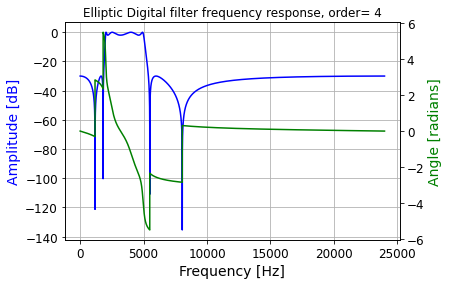

In [0]:
plot_freq_response('Elliptic', w, h, N)

### Filtro de Bessel


In [0]:
from scipy.signal import bessel

In [0]:
N = 4
normalization = 'mag' #Ajusta la frecuencia crítica según la respuesta que se desea
num, den = bessel(N, Wn=Wn, btype=filt, norm=normalization, output=out, fs=fs) #regresa numerador y denominador. Si se quiere obtener los polos y ceros usar scipy.signal.tf2zpk
w, h = freqz(num, den, worN=K, fs=fs)

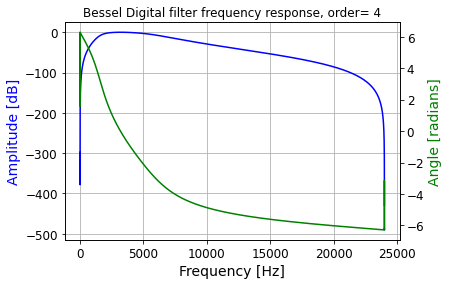

In [0]:
plot_freq_response('Bessel', w, h, N)

# Ecualización
Entre las diversas aplicaciones que tienen los filtros está el procesado de audio. Los dispositivos que ayudan a realizar estas tareas son los llamados ecualizadores, con los que se pueden realzar sonidos a unas determinadas frecuencias o suprimirlos si se desea.

In [0]:
#Audio sobre el que se va a trabajar para este ejemplo.
link="https://www.youtube.com/watch?v=_ghCnV_z7Vc"
! youtube-dl --extract-audio -o "audio2.%(mp3)s" --audio-format mp3  {link}

!ffmpeg -i audio2.mp3 output2.wav

nombre_out = "output2.wav"
x, fs = sf.read(nombre_out)

[youtube] _ghCnV_z7Vc: Downloading webpage
[download] Destination: audio2.NA
[download] 100% of 3.43MiB in 00:00
[ffmpeg] Destination: audio2.mp3
Deleting original file audio2.NA (pass -k to keep)
ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --en

In [0]:
x2 = x.copy()
ti = 63
tf = ti + 6
xs = x2[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1

Audio([xs[:,1], xs[:,0]],rate=fs) #segmento de audio

## Filtro paso alto
En los instrumentos musicales existe una banda de frecuencias en los que se pueden tocar, mientras que en otros les es imposible. Por este motivo es que es posible suprimir algunos instrumentos de una pista mediante el uso de filtros.

Como ejemplo, supongase que en el audio anterior se quiere suprimir el sonido del bajo eléctrico. Como su nombre lo indica, este es un instrumento que se caracteriza por manejar una banda de frecuencias bajas (sonidos graves), por lo que aplicando un filtro de paso alto se podría realizar esta tarea.



In [0]:
filtro = "highpass"
N = 6
frec = 1000

ripple_pass = 2
ripple_stop = 101
num, den = ellip(N, rp=ripple_pass, rs=ripple_stop, Wn=frec, btype=filtro, fs=fs) 

In [0]:
from scipy.signal import lfilter

In [0]:
xf = lfilter(num, den, xs, axis=0)

In [0]:
Audio([xf[:,1], xf[:,0]],rate=fs) #Resultado

## Filtro paso bajo
Un problema que le ocurre continuamente a las señales es la presencia de ruido. A continuación se muestra el mismo audio contaminado con ruido blanco

In [0]:
x_n = xs + np.random.normal(loc=0, scale=0.05, size=xs.shape)

In [0]:
Audio([x_n[:,1], x_n[:,0]],rate=fs) #Resultado

Por lo general el ruido se caracteriza por manejar una banda de frecuencias altas. Teniendo esto en cuenta, puede deshacerse de dicho ruido aplicando un filtro que suprima las frecuencias altas, es decir, un filtro pasabajas.

In [0]:
filtro = "lowpass"
N = 10
frec = 1600

ripple_pass = 1
ripple_stop = 100
num, den = ellip(N, rp=ripple_pass, rs=ripple_stop, Wn=frec, btype=filtro, fs=fs)

xf = lfilter(num, den, x_n, axis=0)

En el audio filtrado se percibe menos ruido, pero las fecuencias altas del audio original también se ven afectadas.

In [0]:
Audio([xf[:,1], xf[:,0]],rate=fs) #Audio con ruido filtrado